# Predicint preferred accommodation for a personalized travel recommendation system

# Predicting preferred accommodation for a presonalized travel recommendation system

The project will consist of the following flow:

- Reading the data in python
- Defining the problem statement
- Identifying the Target variable
- Looking at the distribution of Target variable
- Basic Data exploration
- Rejecting useless columns
- Visual Exploratory Data Analysis for data distribution (Histogram and Barcharts)
- Feature Selection based on data distribution
- Outlier treatment
- Missing Values treatment
- Visual correlation analysis
- Statistical correlation analysis (Feature Selection)
- Converting data to numeric for ML
- Deploying the best model in production

# Reading the data into python

This can be considered as one for the most important steps in Machine Learning. There must be a good understanding of the data and its domein well before trying to apply any Machine Learning Mode.

The data used is file "train_data.txt". The data has 9868 car prices with its attributes

# Data description
The business meaning of each column in the data is as below

- id: unique id numbers
- durationOfStay: amount of days stayed
- Gender: Male or Female
- Age: the age of the booker
- Kids: if the booker comes with kids
- destinationCode: Location of the accommodation
- import numpy as np


In [702]:
import numpy as np
import pandas as pd 
import seaborn as sns

from matplotlib import pyplot as plt
from matplotlib.pyplot import figure

import math as mt
import missingno as msno
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score,roc_auc_score, roc_curve
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.neighbors import LocalOutlierFactor
from sklearn.preprocessing import MinMaxScaler, LabelEncoder, StandardScaler, RobustScaler

from sklearn.linear_model import LogisticRegression


import warnings
warnings.filterwarnings("ignore")
warnings.simplefilter(action='ignore', category=FutureWarning)


pd.set_option('display.max_columns', None)
pd.set_option('display.float_format', lambda x: '%.3f' % x)

#### Data preprocessing

In [703]:
# loading the data from the text file to pandas DataFrame
data = pd.read_csv('train_data.txt', header=None)

In [704]:
# Check head of the data
data.head()

,0
0,"[1] ""Record 1"""
1,[1] 1010286
2,[1] 7
3,[1] F
4,[1] 40


*We can see that all the data is in one column. Every value in each 7 rows are values for the columns. Lets creata a for loop to seperate the data in the right order*

In [705]:
# shape of the dataframe
data.shape

(78944, 1)

In [706]:
# removing "[1] " from all the rows
data[0] = data[0].str[4:]

In [707]:
data.head()

,0
0,"""Record 1"""
1,1010286
2,7
3,F
4,40


In [708]:
# getting the featires and target for first data point (first 8 rows)
data_separate = data.head(8)

In [709]:
print(data_separate)

            0
0  "Record 1"
1     1010286
2           7
3           F
4          40
5           0
6          SE
7         Apt


In [710]:
# transpose the array
transposed_data = data_separate.T

In [711]:
# removing the first data point from the dataframe
data = data.iloc[8:]

In [712]:
# 2nd data point
data.head()

,0
8,"""Record 2"""
9,1000152
10,5
11,M
12,<NA>


In [713]:
# Last Data Point
data.tail(8)

,0
78936,"""Record 9868"""
78937,1000340
78938,3
78939,F
78940,49
78941,1
78942,IT
78943,Apt


In [714]:
# creating a for loop to separate each data point and creating a new structured dataframe

j = 8

for i in range(9867):

  data_separate = data.head(j)
  df = data_separate.T

  df = df.set_axis([0,1,2,3,4,5,6,7], axis=1, inplace=False)

  frames = [transposed_data, df]
  transposed_data = pd.concat(frames, axis=0)

  data = data.iloc[8:]



In [715]:
transposed_data.head()

,0,1,2,3,4,5,6,7
0,"""Record 1""",1010286,7,F,40,0,SE,Apt
0,"""Record 2""",1000152,5,M,<NA>,0,<NA>,Apt
0,"""Record 3""",1009019,4,F,39,1,ES,Hotel
0,"""Record 4""",1007840,5,F,45,0,NL,Hotel
0,"""Record 5""",1006939,5,M,45,1,UK,Hotel


In [716]:
transposed_data.tail()

,0,1,2,3,4,5,6,7
0,"""Record 9864""",1002141,2,F,42,0,ES,Apt
0,"""Record 9865""",1009145,6,M,43,1,DK,Apt
0,"""Record 9866""",1008594,4,M,39,0,IT,Hotel
0,"""Record 9867""",1007938,3,M,37,1,IT,Hotel
0,"""Record 9868""",1000340,3,F,49,1,IT,Apt


In [717]:
# reset the index of the dataframe
df = transposed_data.reset_index()

In [718]:
df.head()

,index,0,1,2,3,4,5,6,7
0,0,"""Record 1""",1010286,7,F,40,0,SE,Apt
1,0,"""Record 2""",1000152,5,M,<NA>,0,<NA>,Apt
2,0,"""Record 3""",1009019,4,F,39,1,ES,Hotel
3,0,"""Record 4""",1007840,5,F,45,0,NL,Hotel
4,0,"""Record 5""",1006939,5,M,45,1,UK,Hotel


In [719]:
df.tail()

,index,0,1,2,3,4,5,6,7
9863,0,"""Record 9864""",1002141,2,F,42,0,ES,Apt
9864,0,"""Record 9865""",1009145,6,M,43,1,DK,Apt
9865,0,"""Record 9866""",1008594,4,M,39,0,IT,Hotel
9866,0,"""Record 9867""",1007938,3,M,37,1,IT,Hotel
9867,0,"""Record 9868""",1000340,3,F,49,1,IT,Apt


In [720]:
# dropping the initial index column
df = df.drop(columns='index',axis=1)

In [721]:
# rename the columns
df.rename(columns = {0:'Record Number',1:'id',2:'durationOfStay',3:'gender',4:'Age',5:'kids',6:'destinationCode',7:'AcomType'}, inplace = True)

In [722]:
df.head()

,Record Number,id,durationOfStay,gender,Age,kids,destinationCode,AcomType
0,"""Record 1""",1010286,7,F,40,0,SE,Apt
1,"""Record 2""",1000152,5,M,<NA>,0,<NA>,Apt
2,"""Record 3""",1009019,4,F,39,1,ES,Hotel
3,"""Record 4""",1007840,5,F,45,0,NL,Hotel
4,"""Record 5""",1006939,5,M,45,1,UK,Hotel


In [723]:
# replace <NA> values with np.nan
df.replace('<NA>', np.nan, inplace=True)

#### Lets check for duplicates in the dataset

In [724]:
print('Shape before deleting duplicate values:', df.shape)

# Removing duplicate rows if any
df=df.drop_duplicates()
print('Shape After deleting duplicate values:', df.shape)


Shape before deleting duplicate values: (9868, 8)
Shape After deleting duplicate values: (9868, 8)


## Defining the problem statement: 

For us to create a Machine Learning model which can predict the Accommodation type 

- Target Variable (depdendent variable): Acomtype 
- Predictors (independent variable): id, durationOfStay, gender, Age, Kids, destinationCode

## Determining the type of Machine Learning Model
Based on the problem statement you can understand that we need to create a classification model, as the target variable is categorical.

# Exploratory Data Analysis (EDA)

This step is performed to guage the overall data. The volume of data, the types of columns present in the data. Initial assessment of the data should be done to identify which columns are Quantitative, Categorical or Qualitative.

This step helps to start the column rejection process. You must look at each column carefully and ask, does this column affect the values of the Target variable? For example in this case study, you will ask, does this column affect the Price of the car? If the answer is a clear "No", then remove the column immediately from the data, otherwise keep the column for further analysis.

There are four commands which are used for Basic data exploration in Python

- head() : This helps to see a few sample rows of the data
- info() : This provides the summarized information of the data
- describe() : This provides the descriptive statistical details of the data
- nunique(): This helps us to identify if a column is categorical or continuous

In [725]:
# Looking at sample rows in the data
df.head()

,Record Number,id,durationOfStay,gender,Age,kids,destinationCode,AcomType
0,"""Record 1""",1010286,7,F,40,0,SE,Apt
1,"""Record 2""",1000152,5,M,NaN,0,NaN,Apt
2,"""Record 3""",1009019,4,F,39,1,ES,Hotel
3,"""Record 4""",1007840,5,F,45,0,NL,Hotel
4,"""Record 5""",1006939,5,M,45,1,UK,Hotel


In [726]:
# Observing the summarized information of data
# Data types, Missing values based on number of non-null values Vs total rows etc.
# Remove those variables from data which have too many missing values (Missing Values > 30%)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9868 entries, 0 to 9867
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Record Number    9868 non-null   object
 1   id               9868 non-null   object
 2   durationOfStay   9868 non-null   object
 3   gender           9868 non-null   object
 4   Age              8874 non-null   object
 5   kids             8897 non-null   object
 6   destinationCode  8872 non-null   object
 7   AcomType         9868 non-null   object
dtypes: object(8)
memory usage: 693.8+ KB


In [727]:
# Features Age and Kids have to bo converted to numerical
df["Age"] = pd.to_numeric(df["Age"])
df["kids"] = pd.to_numeric(df['kids'])
df["durationOfStay"] = pd.to_numeric(df['durationOfStay'])
# Lets check if the features correctly got converted
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9868 entries, 0 to 9867
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Record Number    9868 non-null   object 
 1   id               9868 non-null   object 
 2   durationOfStay   9868 non-null   int64  
 3   gender           9868 non-null   object 
 4   Age              8874 non-null   float64
 5   kids             8897 non-null   float64
 6   destinationCode  8872 non-null   object 
 7   AcomType         9868 non-null   object 
dtypes: float64(2), int64(1), object(5)
memory usage: 693.8+ KB


In [728]:
# Looking at the descriptive statistics of the data
df.describe(include='all')

,Record Number,id,durationOfStay,gender,Age,kids,destinationCode,AcomType
count,9868,9868,9868.000,9868,8874.000,8897.000,8872,9868
unique,9868,9868,NaN,2,NaN,NaN,8,2
top,"""Record 1""",1010286,NaN,F,NaN,NaN,BE,Hotel
freq,1,1,NaN,4981,NaN,NaN,1161,5592
mean,NaN,NaN,4.001,NaN,40.416,0.504,NaN,NaN
std,NaN,NaN,1.727,NaN,5.038,0.500,NaN,NaN
min,NaN,NaN,1.000,NaN,22.000,0.000,NaN,NaN
25%,NaN,NaN,3.000,NaN,37.000,0.000,NaN,NaN
50%,NaN,NaN,4.000,NaN,40.000,1.000,NaN,NaN
75%,NaN,NaN,5.000,NaN,44.000,1.000,NaN,NaN


In [729]:
# Finging unique values for each column
# TO understand which column is categorical and which one is Continuous
# Typically if the numer of unique values are < 10 then the variable is likely to be a category otherwise continuous
df.nunique()

Record Number      9868
id                 9868
durationOfStay       13
gender                2
Age                  37
kids                  2
destinationCode       8
AcomType              2
dtype: int64

# Exploratory Data Analysis Results

Based on the basic exploration above, you can now create a simple report of the data, noting down your observations regaring each column. Hence, creating a initial roadmap for further analysis.

The selected columns in this step are not final, further study will be done and then a final list will be created

- Acomtype: Categorical. Selected. This is the Target Variable!
- durationOfStay: Continuous. Selected.
- gender: Categorical. Selected.
- Age: Continuous. Selected.
- Kids: Categorical. Selected.
- destinationCode: Categorical. Selected.
- ID: Continuous. Not Selected.


In [730]:
df.head()

,Record Number,id,durationOfStay,gender,Age,kids,destinationCode,AcomType
0,"""Record 1""",1010286,7,F,40.000,0.000,SE,Apt
1,"""Record 2""",1000152,5,M,NaN,0.000,NaN,Apt
2,"""Record 3""",1009019,4,F,39.000,1.000,ES,Hotel
3,"""Record 4""",1007840,5,F,45.000,0.000,NL,Hotel
4,"""Record 5""",1006939,5,M,45.000,1.000,UK,Hotel


# Removing useless columns from the data

feature id and Record Number as they are nor needed for our machine learning model

# Visual Exploratory Data Analysis

- Categorical variables: Bar plot
- Continuous variables: Histogram

# Visualize distribution of all the Categorical Predictor variables in the data using bar plots

We can spot a categorical variable in the data by looking at the unique values in them. Typically a categorical variable contains less than 10 Unique values AND there is repetition of values, which means the data can be grouped by those unique values.

Based on the Basic Data Exploration above, we have spotted 3 categorical predictors in the data

Categorical Predictors:

'Gender', 'destinationCode', 'Acomtype'

We use bar charts to see how the data is distributed for these categorical columns.



In [731]:
# Plotting multiple bar charts at once for categorical variables
# Since there is no default function which can plot bar charts for multiple columns at once
# we are defining our own function for the same

def PlotBarCharts(inpData, colsToPlot):
    %matplotlib inline
    
    import matplotlib.pyplot as plt
    
    # Generating multiple subplots
    fig, subPlot=plt.subplots(nrows=1, ncols=len(colsToPlot), figsize=(20,5))
    fig.suptitle('Bar charts of: '+ str(colsToPlot))

    for colName, plotNumber in zip(colsToPlot, range(len(colsToPlot))):
        inpData.groupby(colName).size().plot(kind='bar',ax=subPlot[plotNumber])

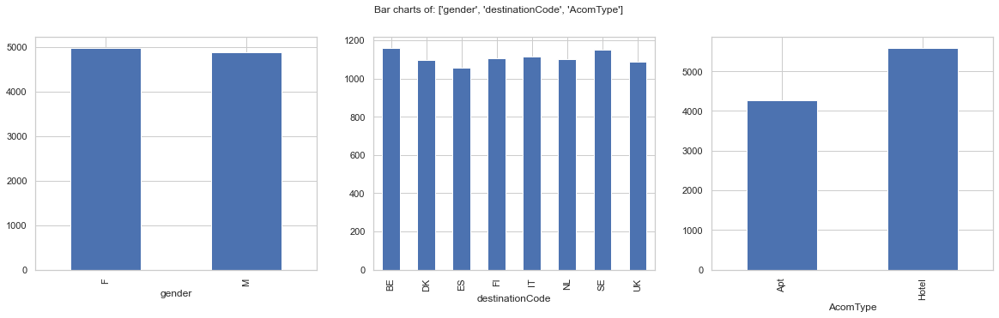

In [732]:
# Calling the function
PlotBarCharts(inpData=df, colsToPlot=['gender', 'destinationCode', 'AcomType'])


Bar Char Interpretation

These bar charts represent the frequencies of each category in the Y-axis and the category names in the X-axis.

In the ideal bar chart each category has comparable frequency. Hence, there are enough rows for each category in the data for the ML algorithm to learn.

If there is a column which shows too skewed distribution where there is only one dominant bar and the other categories are present in very low numbers. These kind of columns may not be very helpful in machine learning. We confirm this in the correlation analysis section and take a final call to select or reject the column.

Selected Categorical Variables: All the categorical variables are selected for further analysis.

'gender', 'destinationCode', 'Acomtype'

## Lets try different visualization methods and dig deeper into the data

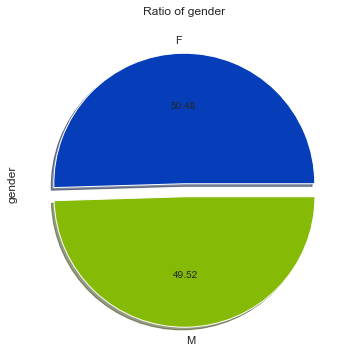

In [733]:
colors=('#063EBA','#85BA06')
explode=[0,0.1]
df['gender'].value_counts().plot(kind='pie',shadow=True,explode=explode,colors=colors,autopct='%.2f',figsize=(8,6))
plt.title('Ratio of gender')
plt.show()

*We can see that the ratio for gender 'Male', 'Female' is almost equally distributed*

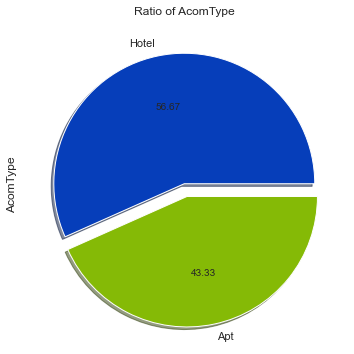

In [734]:
colors=('#063EBA','#85BA06')
explode=[0,0.1]
df['AcomType'].value_counts().plot(kind='pie',shadow=True,explode=explode,colors=colors,autopct='%.2f',figsize=(8,6))
plt.title('Ratio of AcomType')
plt.show()

*We can see that people tend to chose more for accommodation type Hotel*

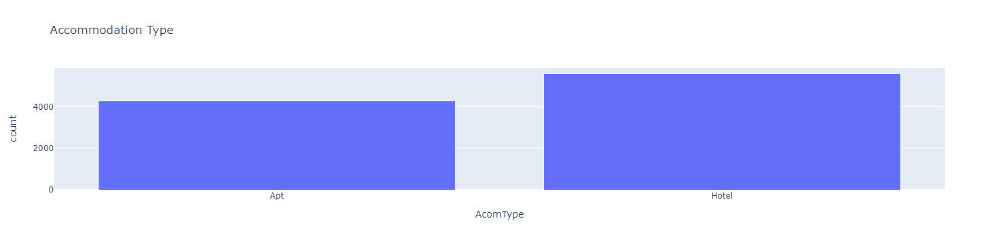

In [735]:
import plotly.express as px                                          # Interactive Data Visualization

fig = px.histogram(df, x = "AcomType",
                  labels = {"AcomType":"AcomType"},
                  title = "Accommodation Type",
                  #color_discrete_sequence = ["Blue"]
                  )
                  
fig.show()

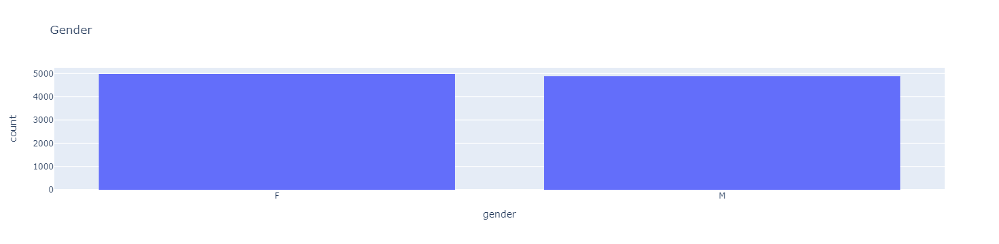

In [736]:
import plotly.express as px                                          # Interactive Data Visualization

fig = px.histogram(df, x = "gender",
                  labels = {"gender":"gender"},
                  title = "Gender",
                  #color_discrete_sequence = ["Blue"]
                  )
                  
fig.show()

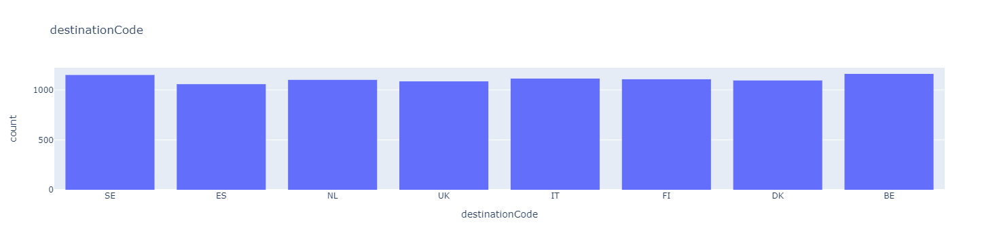

In [737]:
import plotly.express as px                                          # Interactive Data Visualization

fig = px.histogram(df, x = "destinationCode",
                  labels = {"destinationCode":"destinationCode"},
                  title = "destinationCode",
                  #color_discrete_sequence = ["Blue"]
                  )
                  
fig.show()

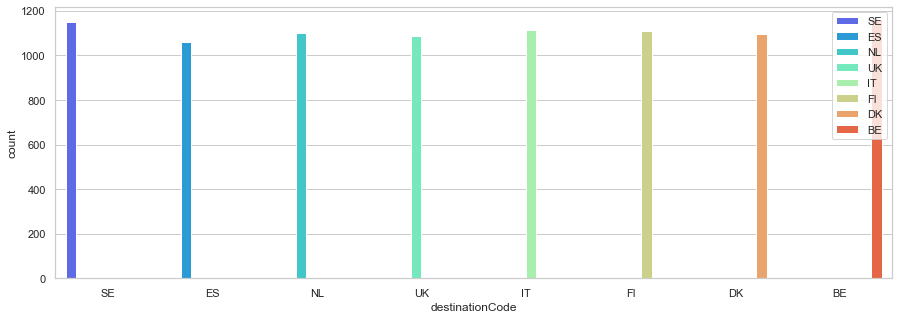

In [738]:
sns.set_style('whitegrid')
plt.figure(figsize=(15,5))
sns.countplot(x='destinationCode',hue='destinationCode',data=df,palette='rainbow')
plt.legend(loc='upper right')

In [739]:
def grab_col_names(df, cat_th=5, car_th=20):
    """
    This function to perform the selection of numeric and categorical variables in the data set in a parametric way.
    Note: Variables with numeric data type but with categorical properties are included in categorical variables.
    """

    # cat cols, cat_but_car
    cat_cols = [col for col in df.columns if df[col].dtypes == "O"]
    num_but_cat = [col for col in df.columns if df[col].dtypes != "O" and
                   df[col].nunique() < cat_th]

    cat_but_car = [col for col in df.columns if df[col].dtypes == "O" and
                   df[col].nunique() > car_th]

    cat_cols = cat_cols + num_but_cat
    cat_cols = [col for col in cat_cols if col not in cat_but_car]

    # num_cols
    num_cols = [col for col in df.columns if df[col].dtypes != "O" and "ID" not in col.upper()]
    num_cols = [col for col in num_cols if col not in num_but_cat]

    return cat_cols,num_cols,cat_but_car

In [740]:
# call the function
cat_cols, num_cols, cat_but_car = grab_col_names(df)

In [741]:
 # General Exploration for Categorical Variables:

def cat_summary(dataframe, plot=False):
    for col_name in cat_cols:
        print("############## Unique Observations of Categorical Data ###############")
        print("The unique number of "+ col_name+": "+ str(dataframe[col_name].nunique()))

        print("############## Frequency of Categorical Data ########################")
        print(pd.DataFrame({col_name : dataframe[col_name].value_counts(),
                            "Ratio": dataframe[col_name].value_counts()/len(dataframe)}))
        if plot == True:
            rgb_values = sns.color_palette("Set2", 6)
            sns.set_theme(style="darkgrid")
            ax = sns.countplot(x=dataframe[col_name], data=dataframe, palette=rgb_values)
            for p in ax.patches:
                ax.annotate(f'\n{p.get_height()}', (p.get_x()+0.2, p.get_height()), ha='center', va='top', color='white', size=10)
            plt.show()

############## Unique Observations of Categorical Data ###############
The unique number of gender: 2
############## Frequency of Categorical Data ########################
   gender  Ratio
F    4981  0.505
M    4887  0.495


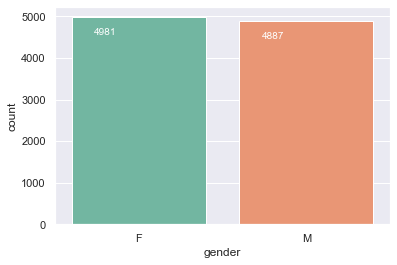

############## Unique Observations of Categorical Data ###############
The unique number of destinationCode: 8
############## Frequency of Categorical Data ########################
    destinationCode  Ratio
BE             1161  0.118
SE             1150  0.117
IT             1114  0.113
FI             1107  0.112
NL             1101  0.112
DK             1095  0.111
UK             1086  0.110
ES             1058  0.107


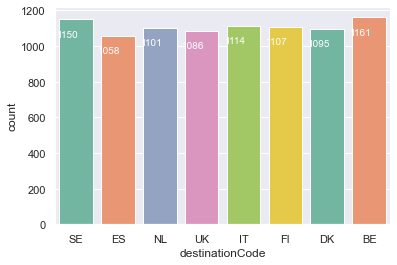

############## Unique Observations of Categorical Data ###############
The unique number of AcomType: 2
############## Frequency of Categorical Data ########################
       AcomType  Ratio
Hotel      5592  0.567
Apt        4276  0.433


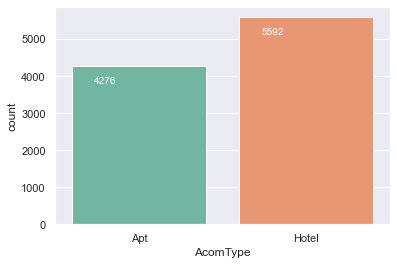

############## Unique Observations of Categorical Data ###############
The unique number of kids: 2
############## Frequency of Categorical Data ########################
       kids  Ratio
1.000  4488  0.455
0.000  4409  0.447


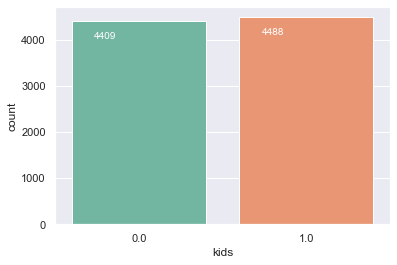

In [742]:
cat_summary(df, plot=True)

In [743]:
# General Exploration for Numerical Variables:

def num_summary(df,  plot=False):
    quantiles = [0.25, 0.50, 0.75, 1]
    for col_name in num_cols:
        print("########## Summary Statistics of " +  col_name + " ############")
        print(df[col_name].describe(quantiles).T)

        if plot:
            sns.histplot(data=df, x=col_name  )
            plt.xlabel(col_name)
            plt.title("The distribution of "+ col_name)
            plt.grid(True)
            plt.show(block=True)

########## Summary Statistics of durationOfStay ############
count   9868.000
mean       4.001
std        1.727
min        1.000
25%        3.000
50%        4.000
75%        5.000
100%      13.000
max       13.000
Name: durationOfStay, dtype: float64


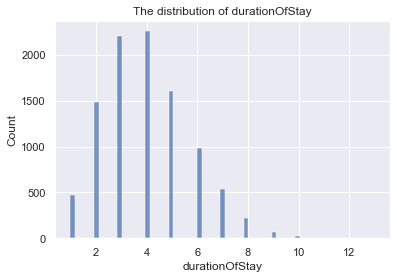

########## Summary Statistics of Age ############
count   8874.000
mean      40.416
std        5.038
min       22.000
25%       37.000
50%       40.000
75%       44.000
100%      59.000
max       59.000
Name: Age, dtype: float64


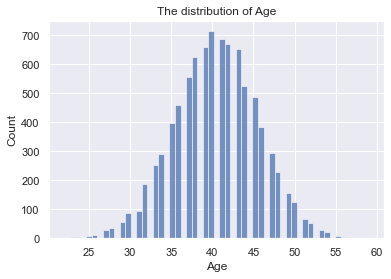

In [744]:
num_summary(df, plot=True)

#### Outlier Detection:

For outlier detection we will use the method IQR

A box plot tells us, more or less, about the distribution of the data. It gives a sense of how much the data is actually spread out, what’s its range, and its skewness

In [745]:
def outlier_thresholds(dataframe, col_name, q1 = 0.25, q3 = 0.75):
    Q1 = dataframe[col_name].quantile(q1)
    Q3 = dataframe[col_name].quantile(q3)
    IQR = Q3 - Q1
    low_limit = Q1 - 1.5 * IQR
    up_limit = Q3 + 1.5 * IQR
    
    return low_limit, up_limit

In [746]:
for col in num_cols:
    print(col,":",outlier_thresholds(df,col))

durationOfStay : (0.0, 8.0)
Age : (26.5, 54.5)


In [747]:
def check_outlier(dataframe, q1=0.25, q3=0.75):
    for col_name in num_cols:
        low_limit, up_limit = outlier_thresholds(df, col_name, q1, q3)
        if df[(df[col_name] < low_limit) | (df[col_name] > up_limit)].any(axis=None):
            sns.boxplot(x=df[col_name])
            plt.show()
        else:
            return False

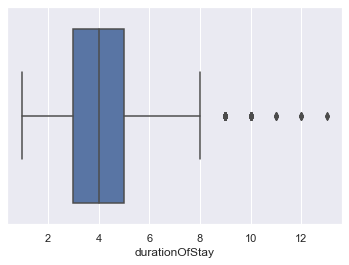

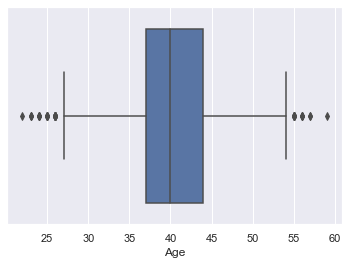

In [748]:
check_outlier(df)

- The maximum age value in the dataset appears to be 59 whereas it is not an impossible situation. So this value may not be considered an outlier for the relevant dataset.

- DurationOfStay is also not outlier as most value are close to the mean

- If we examine the upper and lower limit values for other variables and consider them from this point of view, we can recheck outliers by replacing q1 value as 0.05 and q3 value as 0.95.

In [749]:
check_outlier(df, q1=0.05, q3=0.95)

False

#### Missing Values

Missing values are treated for each column separately.

If a column has more than 30% data missing, then missing value treatment cannot be done. That column must be rejected because too much information is missing.

There are below options for treating missing values in data.

Delete the missing value rows if there are only few records Impute the missing values with MEDIAN value for continuous variables Impute the missing values with MODE value for categorical variables Interpolate the values based on nearby values Interpolate the values based on business logic

In [750]:
# Check the features containing NaN values:

def missing_values_df(dataframe, na_col_name=False):
    na_cols = [col for col in dataframe.columns if dataframe[col].isnull().sum() > 0]
    na_cols_number = dataframe[na_cols].isnull().sum()
    na_cols_ratio = dataframe[na_cols].isnull().sum() / dataframe.shape[0]
    missing_values_table = pd.DataFrame({"Missing_Values (#)": na_cols_number, \
                                         "Ratio (%)": na_cols_ratio * 100,
                                         "Type" : dataframe[na_cols].dtypes})
    print(missing_values_table)
    print("************* Number of Missing Values *************")
    print(dataframe.isnull().sum().sum())
    if na_col_name:
        print("************* Nullable variables *************")
        return na_cols

In [751]:
missing_values_df(df)

                 Missing_Values (#)  Ratio (%)     Type
Age                             994     10.073  float64
kids                            971      9.840  float64
destinationCode                 996     10.093   object
************* Number of Missing Values *************
2961


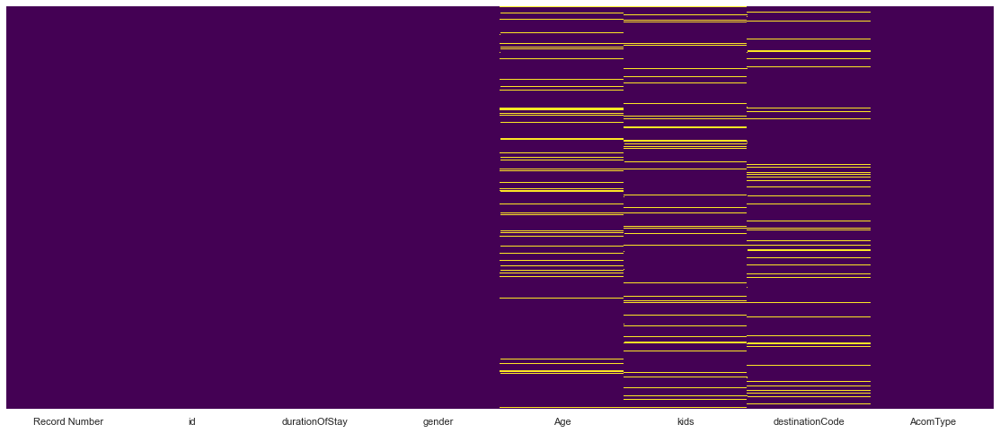

In [752]:
# Visualize Missing Values
sns.set(rc={'figure.figsize':(19.7,8.27)})

sns.heatmap(df.isnull(),yticklabels=False,cbar=False,cmap='viridis')

*As we can see column Age, Kids and destinationCode are features with missing values*
- Age will be replaced with median
- Kids will be replaced with median
- destinationCode will be replaced with Mode

In [753]:
def missing_cat_cols_fill(dataframe):
    na_cols = [col for col in df.columns if df[col].isnull().sum() > 0 and df[col].dtype == "O"]
    for col in na_cols:
        dataframe[col] = dataframe[col].fillna(dataframe[col].mode()[0])
        return dataframe.head()

In [754]:
missing_cat_cols_fill(df)

,Record Number,id,durationOfStay,gender,Age,kids,destinationCode,AcomType
0,"""Record 1""",1010286,7,F,40.000,0.000,SE,Apt
1,"""Record 2""",1000152,5,M,NaN,0.000,BE,Apt
2,"""Record 3""",1009019,4,F,39.000,1.000,ES,Hotel
3,"""Record 4""",1007840,5,F,45.000,0.000,NL,Hotel
4,"""Record 5""",1006939,5,M,45.000,1.000,UK,Hotel


In [755]:
def missing_num_cols_fill(dataframe):
    na_cols = [col for col in df.columns if df[col].isnull().sum() > 0 and df[col].dtype == "float"]
    for col in na_cols:
        dataframe[col] = dataframe[col].fillna(dataframe[col].mean()[0])
        return dataframe.head()

In [756]:
# Treating missing values of continuous variable with Median value
df['Age'].fillna(value=df['Age'].median(), inplace=True)
df['kids'].fillna(value=df['kids'].median(), inplace=True)

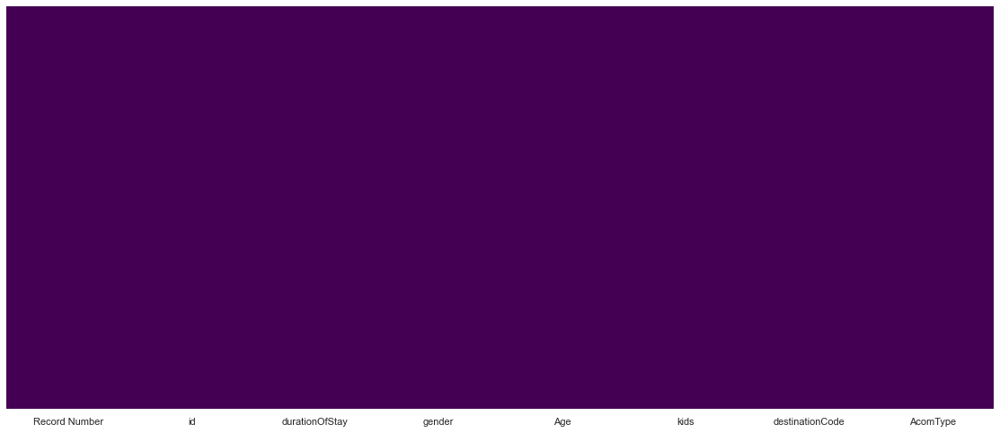

In [757]:
# Sanity check for null values
sns.set(rc={'figure.figsize':(19.7,8.27)})

sns.heatmap(df.isnull(),yticklabels=False,cbar=False,cmap='viridis')

*Null values got handeld*

#### For further analyses lets catogirze features Age and gender in groups of:
- Young
- Mature
- Senior

In [758]:
# Age Level 
df.loc[(df['Age'] < 18.0), 'NEW_AGE_CAT'] = 'Young'
df.loc[(df['Age'] >= 18.0) & (df['Age'] < 50.0), 'NEW_AGE_CAT'] = 'Mature'
df.loc[(df['Age'] >= 50.0), 'NEW_AGE_CAT'] = 'Senior'

 # Age & Sex
df.loc[(df['gender'] == 'M') & (df['Age'] <= 21.0), 'NEW_SEX_CAT'] = 'Young_Male'
df.loc[(df['gender'] == 'M') & ((df['Age'] > 21.0) & (df['Age']) < 40.0), 'NEW_SEX_CAT'] = 'Mature_Male'
df.loc[(df['gender'] == 'M') & (df['Age'] > 40.0), 'NEW_SEX_CAT'] = 'Senior_Male'
df.loc[(df['gender'] == 'F') & (df['Age'] <= 21.0), 'NEW_SEX_CAT'] = 'Young_Female'
df.loc[(df['gender'] == 'F') & ((df['Age'] > 21.0) & (df['Age']) < 40.0), 'NEW_SEX_CAT'] = 'Mature_Female'
df.loc[(df['gender'] == 'F') & (df['Age'] > 40.0), 'NEW_SEX_CAT'] = 'Senior_Female'

In [759]:
df.head()

,Record Number,id,durationOfStay,gender,Age,kids,destinationCode,AcomType,NEW_AGE_CAT,NEW_SEX_CAT
0,"""Record 1""",1010286,7,F,40.000,0.000,SE,Apt,Mature,Mature_Female
1,"""Record 2""",1000152,5,M,40.000,0.000,BE,Apt,Mature,Mature_Male
2,"""Record 3""",1009019,4,F,39.000,1.000,ES,Hotel,Mature,Mature_Female
3,"""Record 4""",1007840,5,F,45.000,0.000,NL,Hotel,Mature,Senior_Female
4,"""Record 5""",1006939,5,M,45.000,1.000,UK,Hotel,Mature,Senior_Male


In [760]:
cat_cols = ['NEW_AGE_CAT','NEW_SEX_CAT']

############## Unique Observations of Categorical Data ###############
The unique number of NEW_AGE_CAT: 2
############## Frequency of Categorical Data ########################
        NEW_AGE_CAT  Ratio
Mature         9557  0.968
Senior          311  0.032


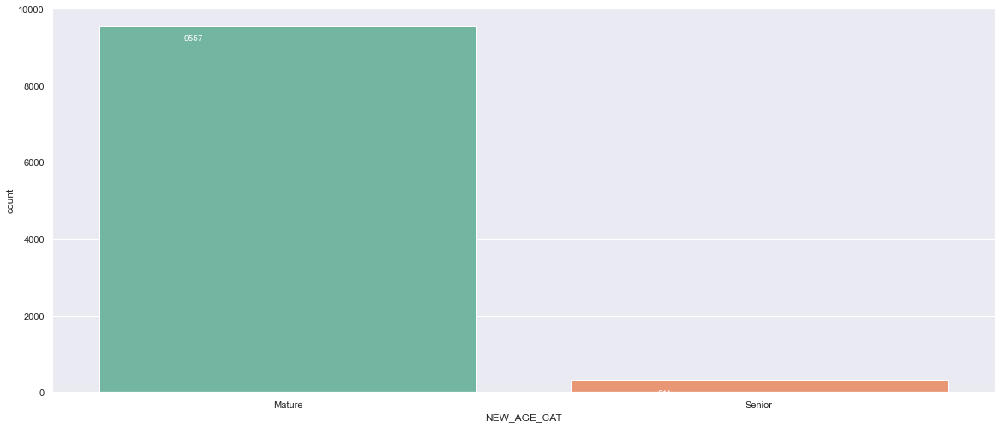

############## Unique Observations of Categorical Data ###############
The unique number of NEW_SEX_CAT: 4
############## Frequency of Categorical Data ########################
               NEW_SEX_CAT  Ratio
Mature_Female         2754  0.279
Mature_Male           2715  0.275
Senior_Female         2227  0.226
Senior_Male           2172  0.220


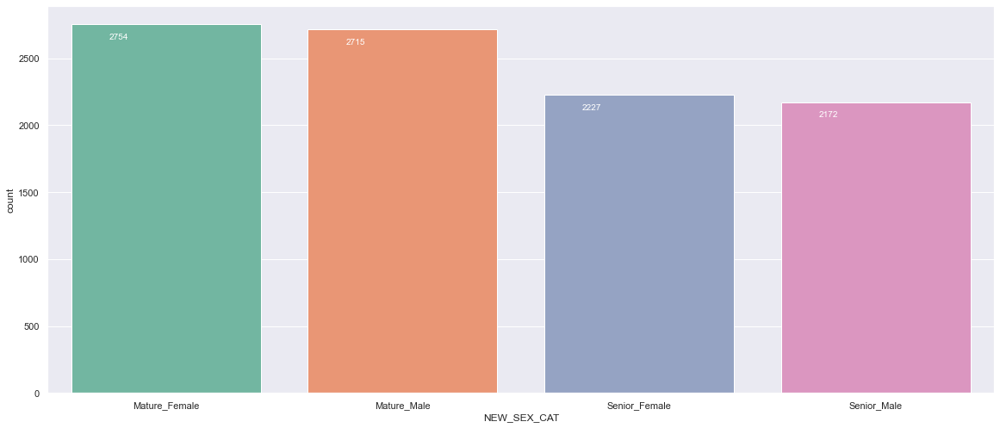

In [761]:
cat_summary(df, plot=True)

### It is interesting to see from the above graphs that there:

- No young bookers
- Most of the bookers are Mature
- Very little bookers are Seniors

Perhaps to increase their customers amount/client base they can start focussing on Senior and Junior Segment.

Junior and Senior segment tend to have lesser money. For the Senior segment they can come up with a certain Senior discount and for the Junior segmet regular deals


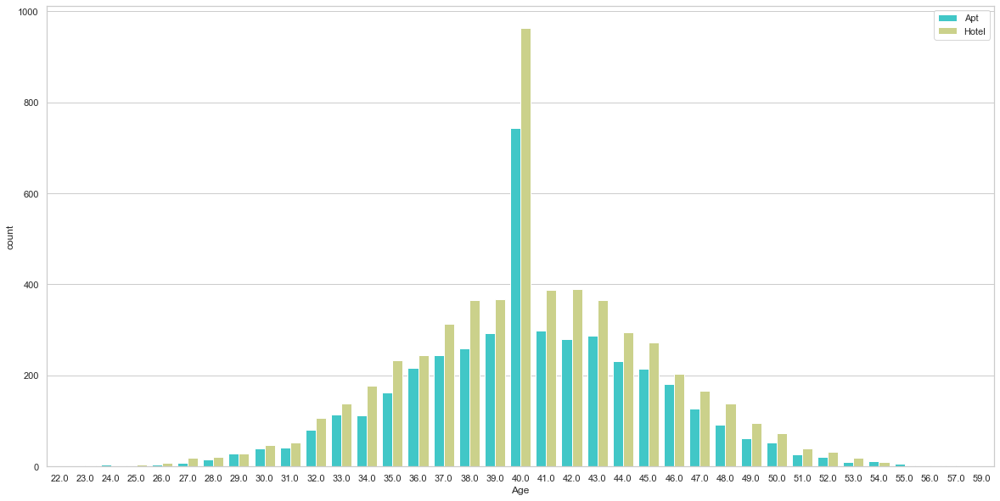

In [762]:
sns.set_style('whitegrid')
plt.figure(figsize=(20,10))
sns.countplot(x='Age',hue='AcomType',data=df,palette='rainbow')
plt.legend(loc='upper right')

#### It is interesting to see as the age increases the choice for Hotel also increases. This can be due to several factors:
- The older you get the less fit you might be to maintain an appartment
- Younger people with younger kids still travel together and therefore an appartment is more convenient

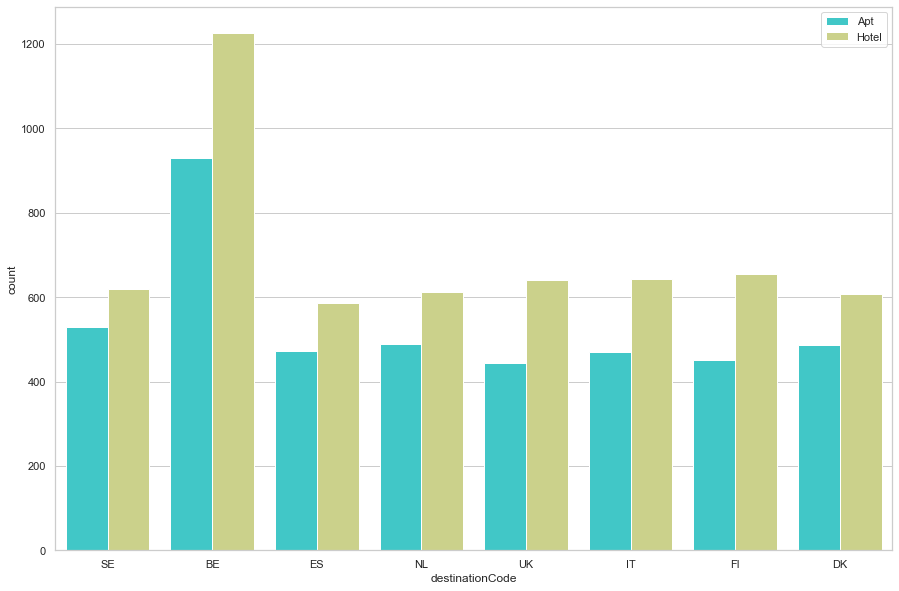

In [763]:
sns.set_style('whitegrid')
plt.figure(figsize=(15,10))
sns.countplot(x='destinationCode',hue='AcomType',data=df,palette='rainbow')
plt.legend(loc='upper right')

### We can see that BE has the higest number of bookers. Perhaps to increase the bookers in the other countries. They can apply the same marketing startegy for BE or do more research why BE has higher bookers compared to the other countries

# Data Pre-processing for Machine Learning

List of steps performed on predictor variables before data can be used for machine learning

- Converting each Ordinal Categorical columns to numeric
- Converting Binary nominal Categorical columns to numeric using 1/0 mapping
- Converting all other nominal categorical columns to numeric using pd.get_dummies()
- Data Transformation (Optional): Standardization/Normalization/log/sqrt. Important if you are using distance based algorithms like KNN, or Neural Networks In this data there is no Ordinal categorical variable which is in string format.

#### Encoding the categorical columns

In [764]:
# encoding the destinationCode column

from sklearn.preprocessing import OrdinalEncoder

ord_enc = OrdinalEncoder()
df["destination"] = ord_enc.fit_transform(df[["destinationCode"]])
df[["destinationCode", "destination"]].head(11)

,destinationCode,destination
0,SE,6.000
1,BE,0.000
2,ES,2.000
3,NL,5.000
4,UK,7.000
5,IT,4.000
6,NL,5.000
7,FI,3.000
8,SE,6.000
9,FI,3.000


In [765]:
# encoding the 'gender' column

from sklearn.preprocessing import OrdinalEncoder

ord_enc = OrdinalEncoder()
df["gender_encoded"] = ord_enc.fit_transform(df[["gender"]])

In [766]:
df.head()

,Record Number,id,durationOfStay,gender,Age,kids,destinationCode,AcomType,NEW_AGE_CAT,NEW_SEX_CAT,destination,gender_encoded
0,"""Record 1""",1010286,7,F,40.000,0.000,SE,Apt,Mature,Mature_Female,6.000,0.000
1,"""Record 2""",1000152,5,M,40.000,0.000,BE,Apt,Mature,Mature_Male,0.000,1.000
2,"""Record 3""",1009019,4,F,39.000,1.000,ES,Hotel,Mature,Mature_Female,2.000,0.000
3,"""Record 4""",1007840,5,F,45.000,0.000,NL,Hotel,Mature,Senior_Female,5.000,0.000
4,"""Record 5""",1006939,5,M,45.000,1.000,UK,Hotel,Mature,Senior_Male,7.000,1.000


#### Encoding the targel column

In [767]:
from sklearn.preprocessing import LabelEncoder
encoder = LabelEncoder()
labels = encoder.fit_transform(df['AcomType'])
df['AcomType_encoded'] = encoder.fit_transform(df['AcomType'])
y = labels
print(labels)

[0 0 1 ... 1 1 0]


# Machine Learning: Splitting the data into Training and Testing sample

We dont use the full data for creating the model. Some data is randomly selected and kept aside for checking how good the model is. This is known as Testing Data and the remaining data is called Training data on which the model is built. Typically 70% of data is used as Training data and the rest 30% is used as Tesing data.

In [768]:
# dropping the target column and irrelevant columns
X = df.drop(columns=['Record Number','id','AcomType','destinationCode','gender', 'NEW_AGE_CAT', 'NEW_SEX_CAT', 'AcomType_encoded'], axis=1)
Y = df['AcomType_encoded']

In [769]:
X.shape

(9868, 5)

In [770]:
Y.shape

(9868,)

# Random Forest Classifier

In [771]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2,stratify=Y, random_state=2)

In [772]:
print(X.shape, X_train.shape, X_test.shape)

(9868, 5) (7894, 5) (1974, 5)


In [773]:
model = RandomForestClassifier()

In [774]:
# training the Random Forest Classifier model using Training data

model.fit(X_train, Y_train)

RandomForestClassifier()

In [775]:
estimator_limited = model.estimators_[5]
print(estimator_limited)

DecisionTreeClassifier(max_features='auto', random_state=1736489878)


In [776]:
from sklearn.tree import export_graphviz
export_graphviz(estimator_limited, out_file='tree_limited.dot',
                rounded = True, proportion = False, precision = 2, filled = True)

In [777]:
!dot -Tpng tree_limited.dot -o tree_limited.png -Gdpi=10000000

dot: graph is too large for cairo-renderer bitmaps. Scaling by 1.52583e-005 to fit


In [778]:
from IPython.display import Image
Image(filename = 'tree_limited.png')

# Model Evaluation

In [779]:
# accuracy on training data
X_train_pred = model.predict(X_train)
training_data_accuracy = accuracy_score(Y_train, X_train_pred)

In [780]:
print('Accuracy on training data = ', training_data_accuracy)

Accuracy on training data =  0.84899923992906


In [781]:
# accuracy on test data
X_test_pred = model.predict(X_test)
test_data_accuracy = accuracy_score(Y_test, X_test_pred)

In [782]:
print('Accuracy on test data = ', test_data_accuracy)

Accuracy on test data =  0.7355623100303952


### We can see that our accuracy on Training Data is higher compared to the Accuracy on the test data which means our model is not overfitting

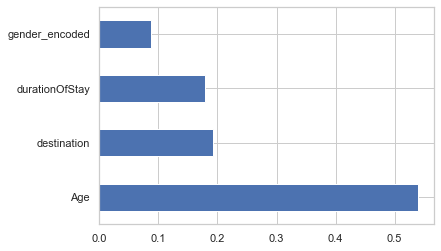

In [807]:
# Plotting the feature importance for Top 10 most important columns
%matplotlib inline
feature_importances = pd.Series(DT.feature_importances_, index=Predictors)
feature_importances.nlargest(10).plot(kind='barh')

# Let's Make predictions on Test Dataset

In [784]:
# loading the test dataset to pandas dataframe
test_data = pd.read_csv('TestDataAccomodation.csv')

In [785]:
# dropping the 'AcomType' column
test_data = test_data.drop(columns='AcomType', axis=1)

In [786]:
test_data.head()

,id,durationOfStay,gender,Age,kids,destinationCode
0,1013319,2,F,38.000,0.000,BE
1,1009485,6,M,37.000,0.000,ES
2,1002725,1,M,37.000,1.000,ES
3,1001133,5,F,50.000,0.000,UK
4,1000794,4,F,42.000,1.000,DK


In [787]:
test_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4229 entries, 0 to 4228
Data columns (total 6 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               4229 non-null   int64  
 1   durationOfStay   4229 non-null   int64  
 2   gender           4229 non-null   object 
 3   Age              3814 non-null   float64
 4   kids             3791 non-null   float64
 5   destinationCode  3816 non-null   object 
dtypes: float64(2), int64(2), object(2)
memory usage: 198.4+ KB


In [788]:
mod_df = test_data

In [789]:
# dropping missing values in 'destinationCode' column
mod_df['destinationCode'].fillna(mod_df['destinationCode'].mode()[0],inplace=True)
# filling missing values with Mean value:
mod_df['Age'].fillna(mod_df['Age'].mean(),inplace=True)
# filling missing values with Mean value:
mod_df['kids'].fillna(mod_df['kids'].mean(),inplace=True)

In [790]:
mod_df.head()

,id,durationOfStay,gender,Age,kids,destinationCode
0,1013319,2,F,38.000,0.000,BE
1,1009485,6,M,37.000,0.000,ES
2,1002725,1,M,37.000,1.000,ES
3,1001133,5,F,50.000,0.000,UK
4,1000794,4,F,42.000,1.000,DK


In [791]:
# encoding destinationCode column
ord_enc = OrdinalEncoder()
mod_df["destination"] = ord_enc.fit_transform(mod_df[["destinationCode"]])

In [792]:
# encoding gender column
ord_enc = OrdinalEncoder()
mod_df["gender_encoded"] = ord_enc.fit_transform(mod_df[["gender"]])

In [793]:
mod_df.head()

,id,durationOfStay,gender,Age,kids,destinationCode,destination,gender_encoded
0,1013319,2,F,38.000,0.000,BE,0.000,0.000
1,1009485,6,M,37.000,0.000,ES,2.000,1.000
2,1002725,1,M,37.000,1.000,ES,2.000,1.000
3,1001133,5,F,50.000,0.000,UK,7.000,0.000
4,1000794,4,F,42.000,1.000,DK,1.000,0.000


In [794]:
# dropping the unnecessary columns
test_dataset = mod_df.drop(columns=['id','destinationCode','gender'], axis=1)

In [795]:
test_dataset.head()

,durationOfStay,Age,kids,destination,gender_encoded
0,2,38.000,0.000,0.000,0.000
1,6,37.000,0.000,2.000,1.000
2,1,37.000,1.000,2.000,1.000
3,5,50.000,0.000,7.000,0.000
4,4,42.000,1.000,1.000,0.000


In [796]:
# predicting the AcomType values
prediction = model.predict(test_dataset)

In [797]:
# creating a column in the data frame for prediction
test_dataset['AcomType'] = prediction

In [798]:
test_dataset.head()

,durationOfStay,Age,kids,destination,gender_encoded,AcomType
0,2,38.000,0.000,0.000,0.000,0
1,6,37.000,0.000,2.000,1.000,1
2,1,37.000,1.000,2.000,1.000,0
3,5,50.000,0.000,7.000,0.000,1
4,4,42.000,1.000,1.000,0.000,0


In [799]:
# Store test_data in a new dataframe
test_data_predicted = test_dataset

In [800]:
# Extract 2 columns from dataframe
destinationCode = df[['destinationCode', 'destination']]

In [801]:
# Merge dataframes together
test_data_predicted = pd.merge(destinationCode, test_data_predicted, left_on='destination', right_on="destination", how='left').fillna(np.nan)

In [802]:
# Print first 5 rows of dataframe
test_data_predicted

,destinationCode,destination,durationOfStay,Age,kids,gender_encoded,AcomType
0,SE,6.000,1,41.000,0.000,1.000,1
1,SE,6.000,3,41.000,1.000,0.000,0
2,SE,6.000,3,47.000,1.000,1.000,1
3,SE,6.000,3,43.000,0.000,1.000,0
4,SE,6.000,4,36.000,0.000,0.000,0
...,...,...,...,...,...,...,...
5156706,IT,4.000,1,33.000,0.504,1.000,0
5156707,IT,4.000,5,35.000,0.504,1.000,0
5156708,IT,4.000,4,40.000,0.000,1.000,0
5156709,IT,4.000,4,36.000,1.000,1.000,0


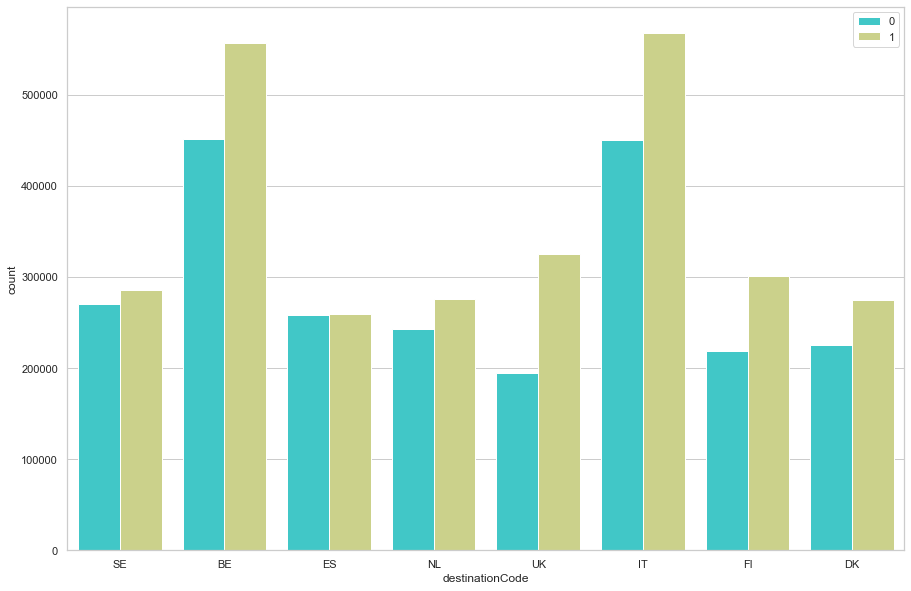

In [806]:
sns.set_style('whitegrid')
plt.figure(figsize=(15,10))
sns.countplot(x='destinationCode',hue='AcomType',data=test_data_predicted,palette='rainbow')
plt.legend(loc='upper right')

0 = Apt \
1 = Hotel

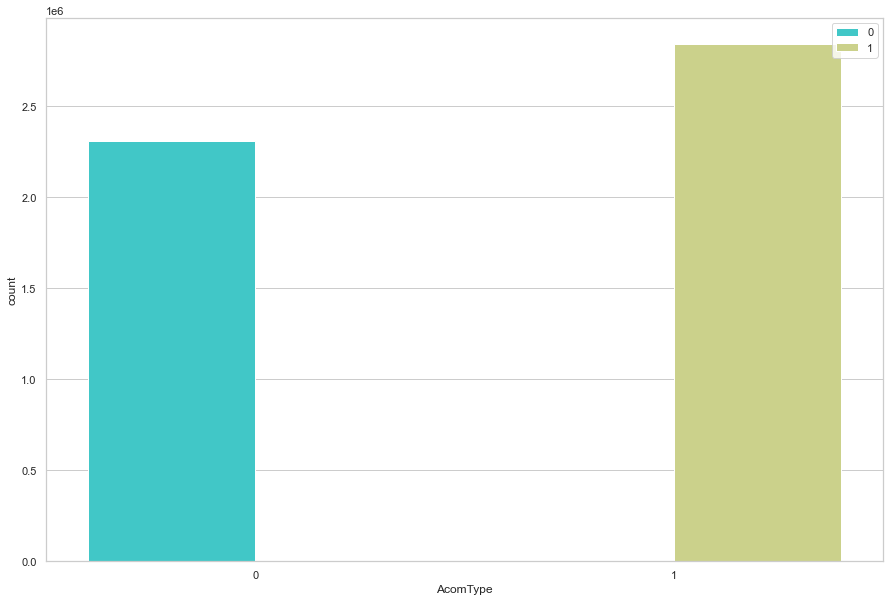

In [804]:
sns.set_style('whitegrid')
plt.figure(figsize=(15,10))
sns.countplot(x='AcomType',hue='AcomType',data=test_data_predicted,palette='rainbow')
plt.legend(loc='upper right')

0 = Apt \
1 = Hotel

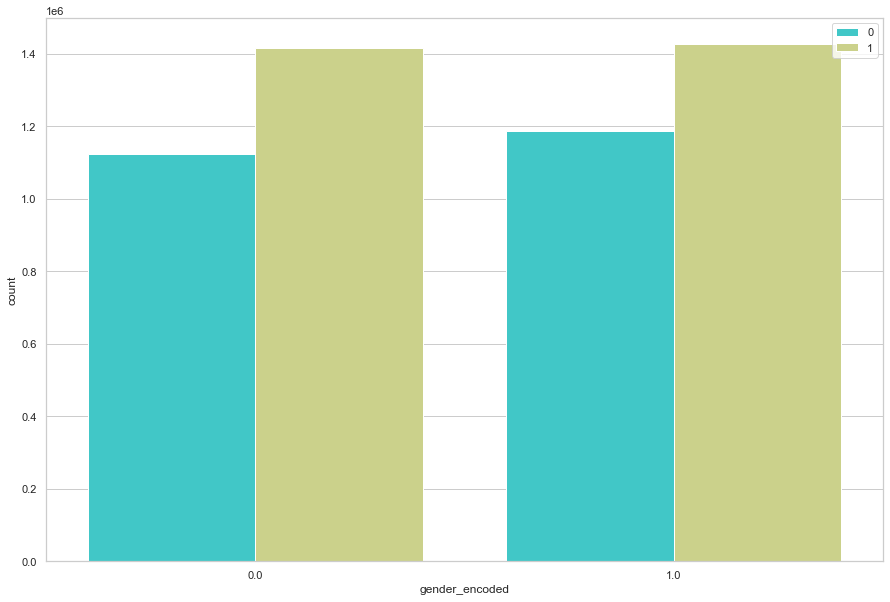

In [805]:
sns.set_style('whitegrid')
plt.figure(figsize=(15,10))
sns.countplot(x='gender_encoded',hue='AcomType',data=test_data_predicted,palette='rainbow')
plt.legend(loc='upper right')

0 = Female \
1 = Male